In [2]:
#Norway 12 Monthly PVOUT Data from 1994 to 2018
import rasterio
import pandas as pd
import numpy as np
import os

# Directory containing 12 monthly TIF files
TIF_DIR = r"C:\GISDataManipulation\GSA Download\Norway_GISdata_LTAym_YearlyMonthlyTotals_GlobalSolarAtlas-v2_GEOTIFF\Norway_GISdata_LTAy_YearlyMonthlyTotals_GlobalSolarAtlas-v2_GEOTIFF\monthly"

# Directory for CSV from TIF, 12 monthly TIF files
CSV_OUTPUT_PATH = r"C:\GISDataManipulation\NorwayPVOUTMergedInput\NorwaySolarPVOUT_12Months.csv"

def solar_tifs_to_csv(tif_directory, csv_path):
    all_month_data = None
    for month in range(1, 13):
        tif_path = os.path.join(tif_directory, f"PVOUT_{month:02d}.tif")

        with rasterio.open(tif_path) as dataset:
            band = dataset.read(1)
            transform = dataset.transform
            height, width = band.shape

            month_data = []

            for row in range(height):
                for col in range(width):
                    value = band[row, col]
                    if not np.isnan(value):
                        lon, lat = rasterio.transform.xy(transform, row, col)
                        month_data.append([lat, lon, value])

            # Convert to DataFrame
            df_month = pd.DataFrame(month_data, columns=["Latitude", "Longitude", f"PVOUT_Month_{month:02d}"])

            # Merge with master DataFrame
            if all_month_data is None:
                all_month_data = df_month
            else:
                # Merge on Latitude and Longitude
                all_month_data = pd.merge(all_month_data, df_month, on=["Latitude", "Longitude"], how="outer")

            print(f"Processed PVOUT:{month:02d}.tif")

    # Save to CSV
    all_month_data.to_csv(csv_path, index=False)
    print(f"All months combined and CSV saved: {csv_path}")

# Run the combined extraction
solar_tifs_to_csv(TIF_DIR, CSV_OUTPUT_PATH)


Processed PVOUT:01.tif
Processed PVOUT:02.tif
Processed PVOUT:03.tif
Processed PVOUT:04.tif
Processed PVOUT:05.tif
Processed PVOUT:06.tif
Processed PVOUT:07.tif
Processed PVOUT:08.tif
Processed PVOUT:09.tif
Processed PVOUT:10.tif
Processed PVOUT:11.tif
Processed PVOUT:12.tif
All months combined and CSV saved: C:\GISDataManipulation\NorwayPVOUTMergedInput\NorwaySolarPVOUT_12Months.csv


Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_January.png


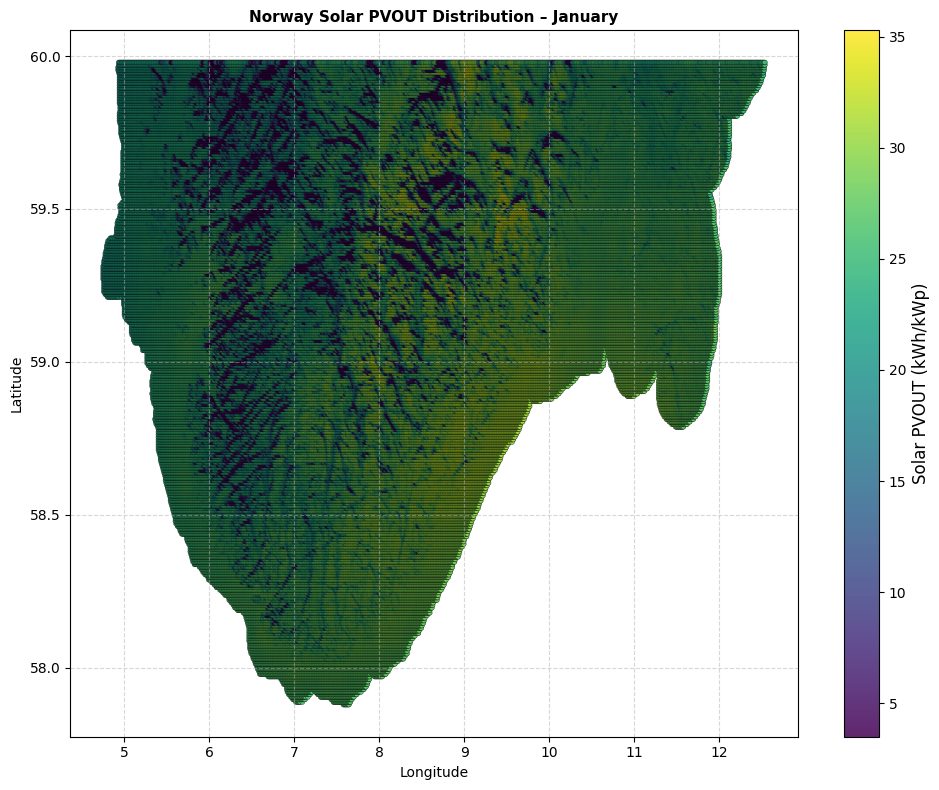

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_February.png


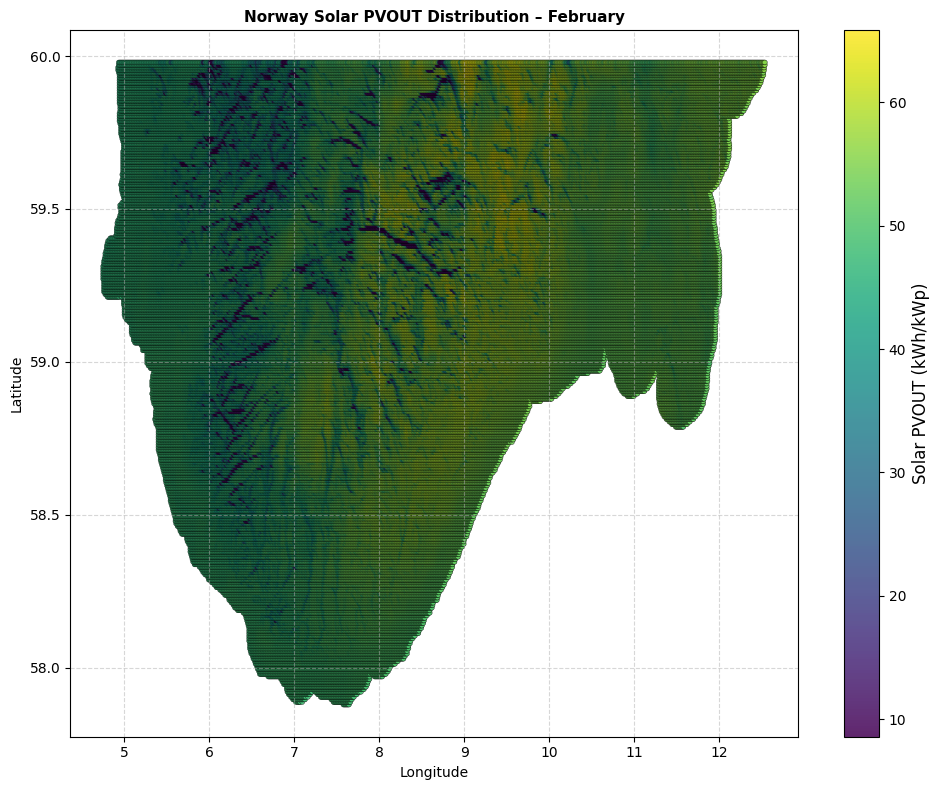

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_March.png


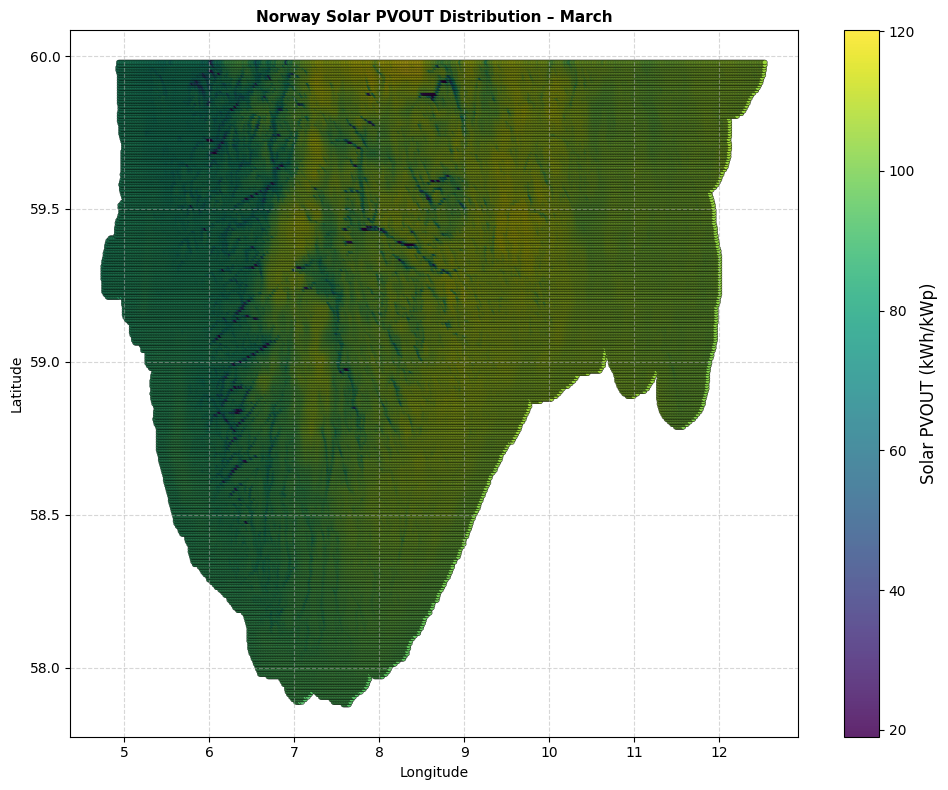

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_April.png


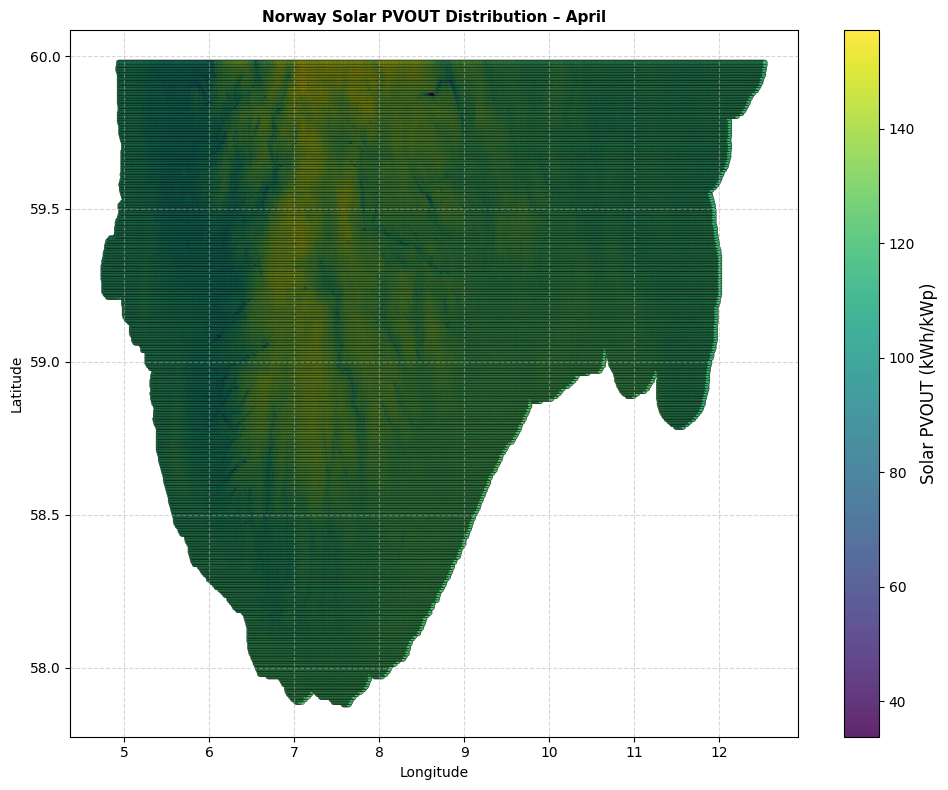

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_May.png


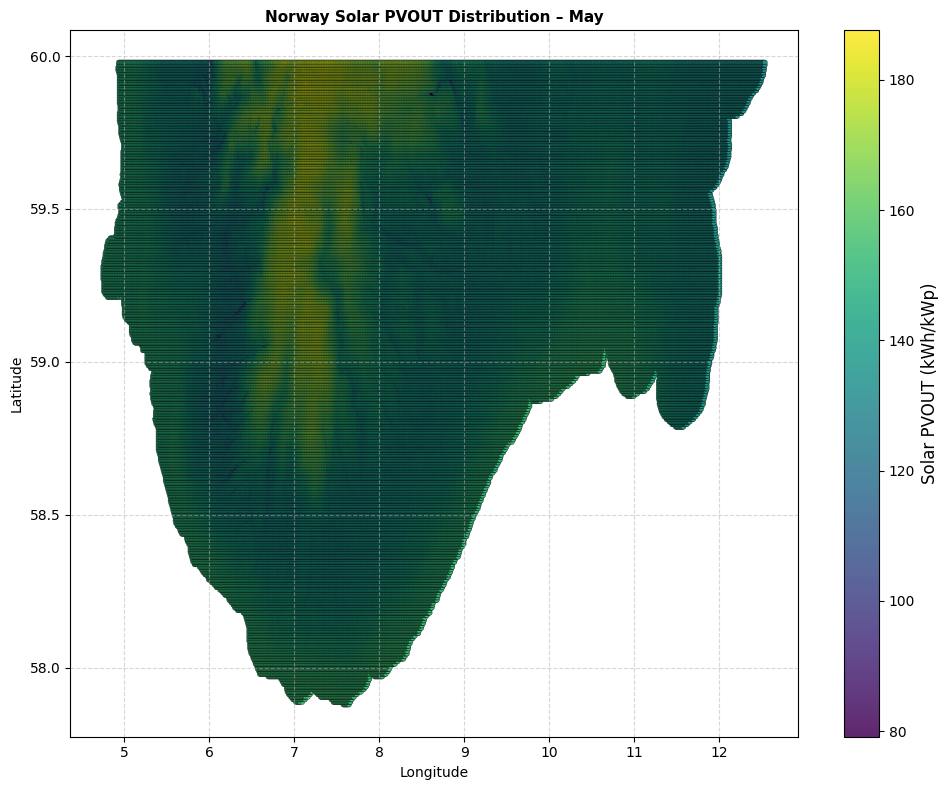

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_June.png


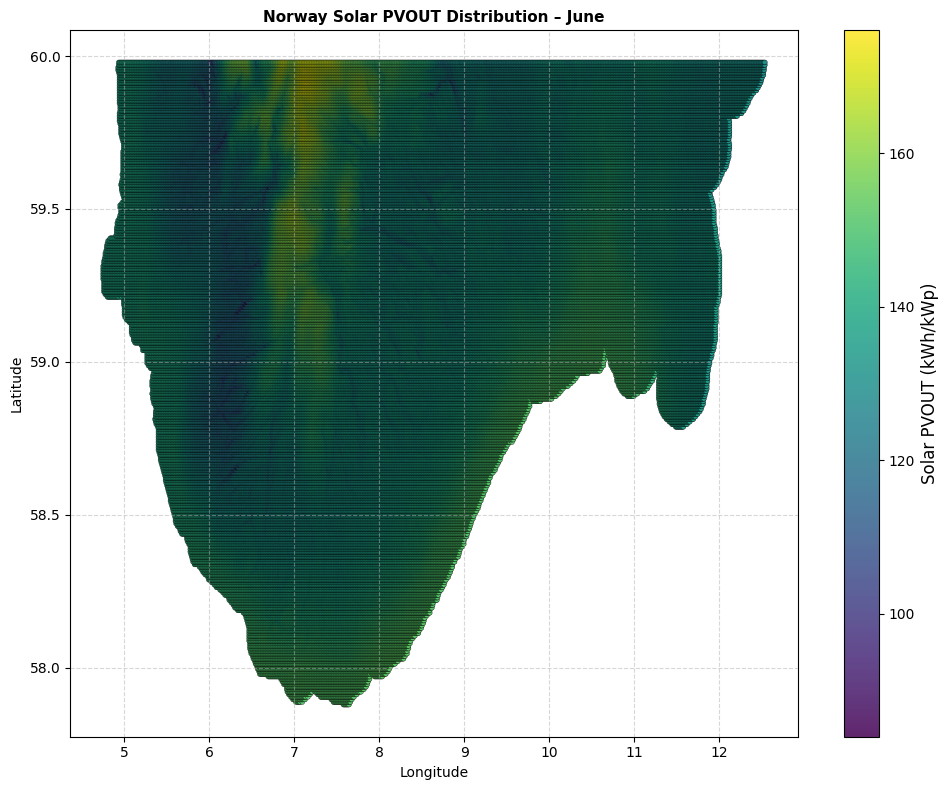

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_July.png


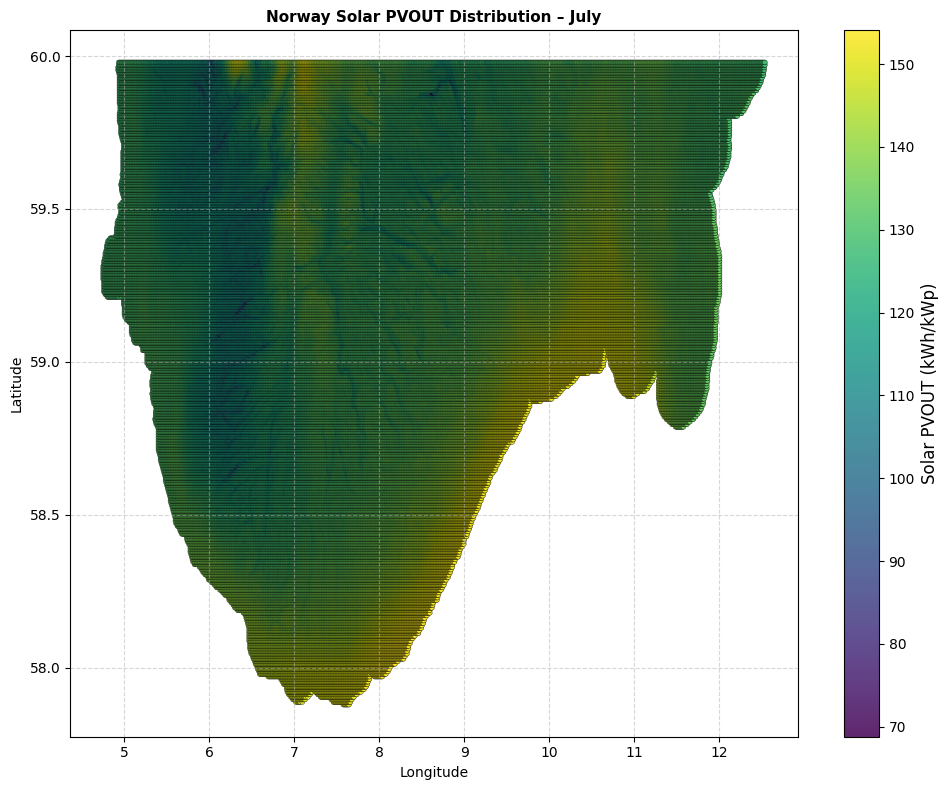

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_August.png


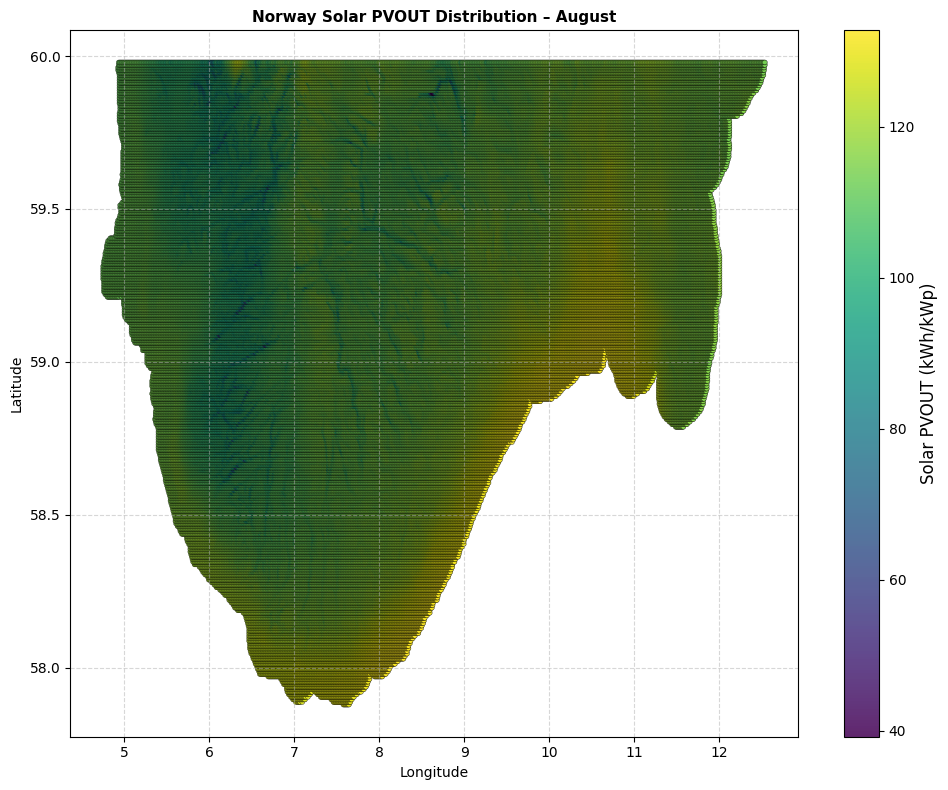

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_September.png


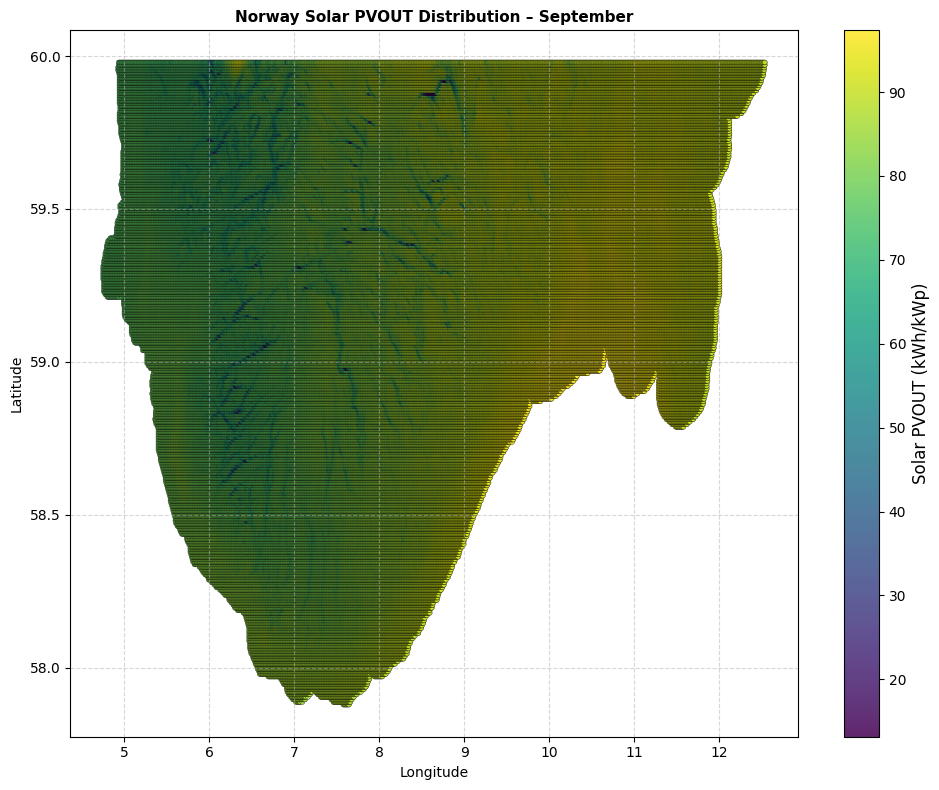

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_October.png


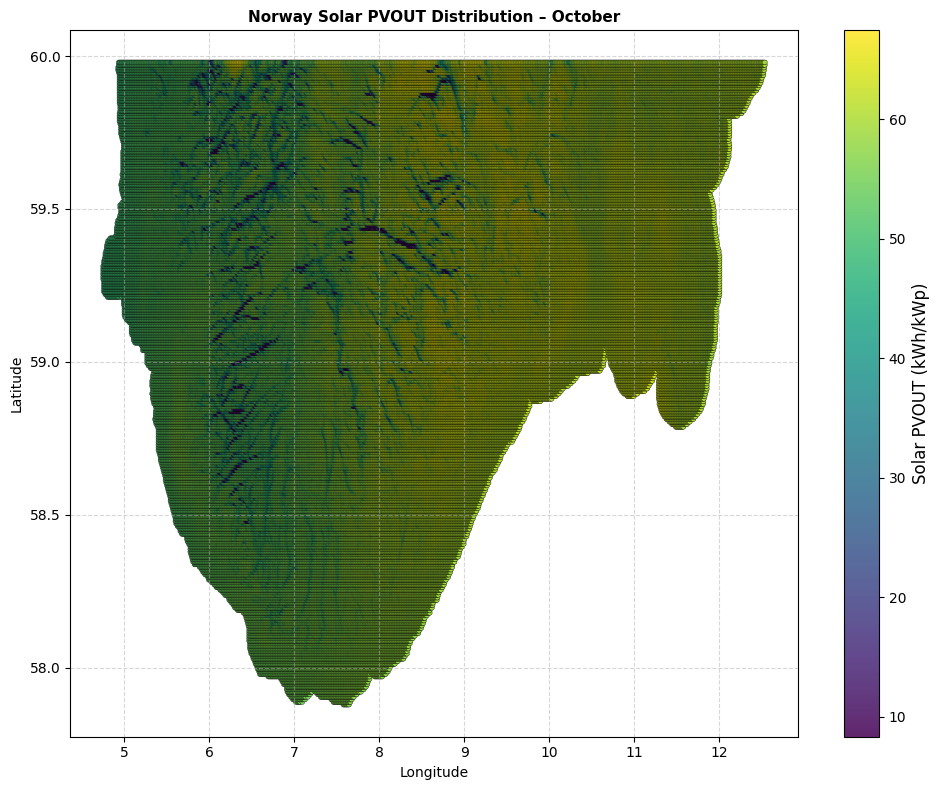

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_November.png


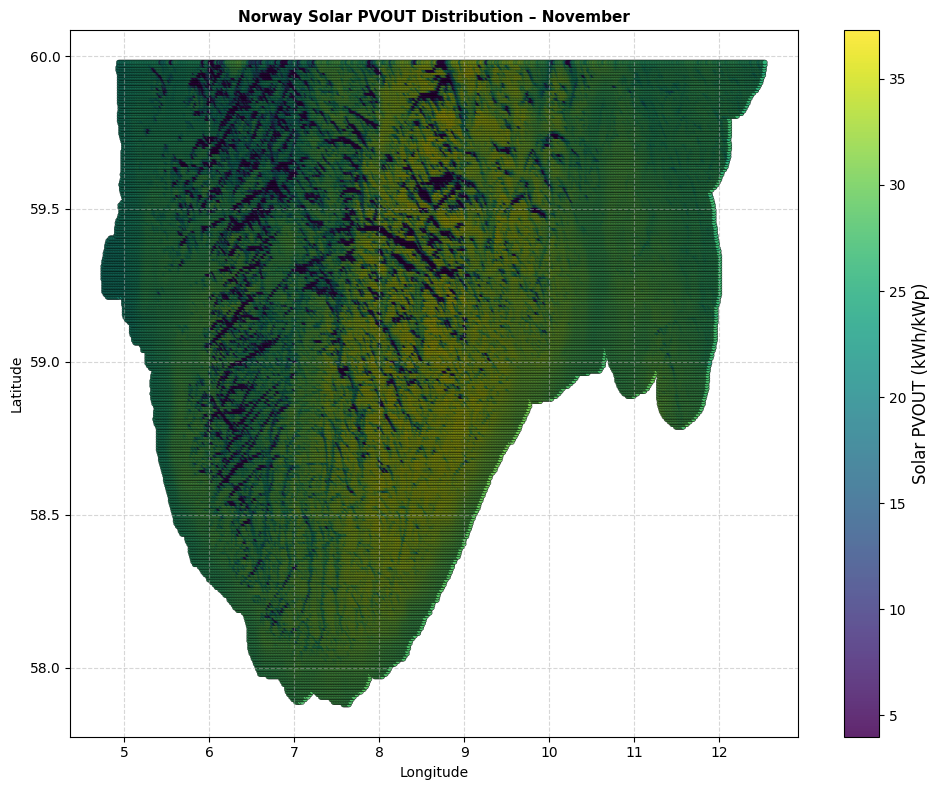

Saved: C:\GISDataManipulation\NorwayPVOUTPlotOutput\Norway_PVOUT_December.png


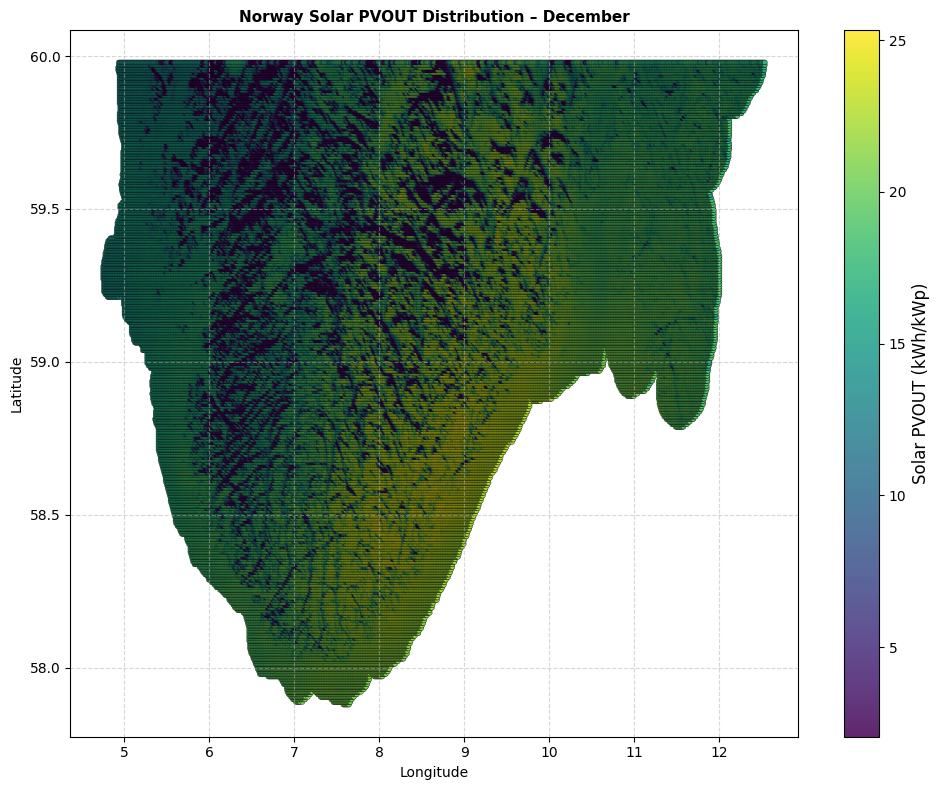

In [3]:
# Norway 12 Months PVOUT Data Plotting from Year 1994 to 2018
import pandas as pd
import matplotlib.pyplot as plt
import os
import calendar

# Load CSV file
CSV_FILE_PATH = r"C:\GISDataManipulation\NorwayPVOUTMergedInput\NorwaySolarPVOUT_12Months.csv"
df = pd.read_csv(CSV_FILE_PATH)

# Output directory for saving plots
OUTPUT_DIR = r"C:\GISDataManipulation\NorwayPVOUTPlotOutput"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Choose a more readable colormap
COLORMAP = "viridis"  # Alternatives: "coolwarm", "turbo", "magma"

# Loop through each month and create plots
for month in range(1, 13):
    month_col = f"PVOUT_Month_{month:02d}"
    month_name = calendar.month_name[month]  # Convert number to full month name

    plt.figure(figsize=(10, 8))
    sc = plt.scatter(
        df["Longitude"],
        df["Latitude"],
        c=df[month_col],
        cmap=COLORMAP,
        s=12,
        alpha=0.85,
        edgecolor="black",
        linewidth=0.3
    )
    cbar = plt.colorbar(sc)
    cbar.set_label("Solar PVOUT (kWh/kWp)", fontsize=12)

    plt.xlabel("Longitude", fontsize=10)
    plt.ylabel("Latitude", fontsize=10)
    plt.title(f"Norway Solar PVOUT Distribution – {month_name}", fontsize=11, fontweight="bold")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()

    # Save each graph as PNG
    save_path = os.path.join(OUTPUT_DIR, f"Norway_PVOUT_{month_name}.png")
    plt.savefig(save_path, dpi=300)
    print(f"Saved: {save_path}")

    plt.show()


In [4]:
#Denmark 12 Monthly PVOUT Data from 1994 to 2018
import rasterio
import pandas as pd
import numpy as np
import os

# Directory containing 12 monthly TIF files
TIF_DIR = r"C:\GISDataManipulation\GSA Download\Denmark_GISdata_LTAym_YearlyMonthlyTotals_GlobalSolarAtlas-v2_GEOTIFF\Denmark_GISdata_LTAy_YearlyMonthlyTotals_GlobalSolarAtlas-v2_GEOTIFF\monthly"

# Directory for CSV from TIF, 12 monthly TIF files
CSV_OUTPUT_PATH = r"C:\GISDataManipulation\DenmarkPVOUTMergedInput\DenmarkSolarPVOUT_12Months.csv"

def solar_tifs_to_csv(tif_directory, csv_path):
    all_month_data = None

    for month in range(1, 13):
        tif_path = os.path.join(tif_directory, f"PVOUT_{month:02d}.tif")

        with rasterio.open(tif_path) as dataset:
            band = dataset.read(1)
            transform = dataset.transform
            height, width = band.shape

            month_data = []

            for row in range(height):
                for col in range(width):
                    value = band[row, col]
                    if not np.isnan(value):
                        lon, lat = rasterio.transform.xy(transform, row, col)
                        month_data.append([lat, lon, value])

            # Convert to DataFrame
            df_month = pd.DataFrame(month_data, columns=["Latitude", "Longitude", f"PVOUT_Month_{month:02d}"])

            # Merge with master DataFrame
            if all_month_data is None:
                all_month_data = df_month
            else:
                # Merge on Latitude and Longitude
                all_month_data = pd.merge(all_month_data, df_month, on=["Latitude", "Longitude"], how="outer")

            print(f"Processed PVOUT:{month:02d}.tif")

    all_month_data.to_csv(csv_path, index=False)
    print(f"All months combined and CSV saved: {csv_path}")

# Run the combined extraction
solar_tifs_to_csv(TIF_DIR, CSV_OUTPUT_PATH)


Processed PVOUT:01.tif
Processed PVOUT:02.tif
Processed PVOUT:03.tif
Processed PVOUT:04.tif
Processed PVOUT:05.tif
Processed PVOUT:06.tif
Processed PVOUT:07.tif
Processed PVOUT:08.tif
Processed PVOUT:09.tif
Processed PVOUT:10.tif
Processed PVOUT:11.tif
Processed PVOUT:12.tif
All months combined and CSV saved: C:\GISDataManipulation\DenmarkPVOUTMergedInput\DenmarkSolarPVOUT_12Months.csv


Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_January.png


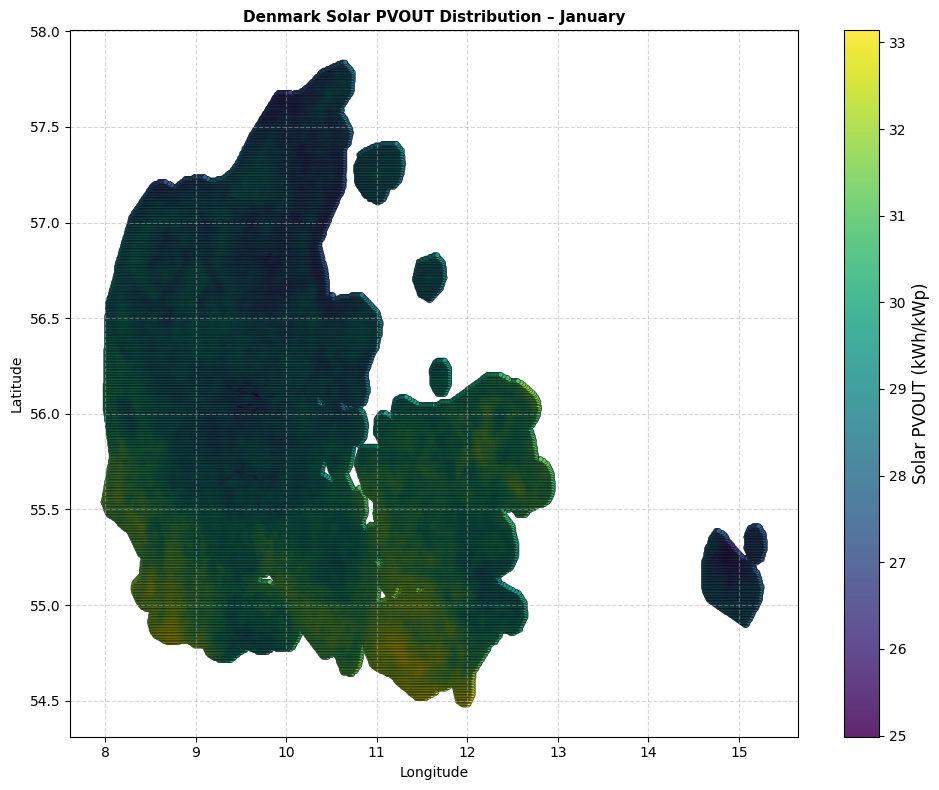

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_February.png


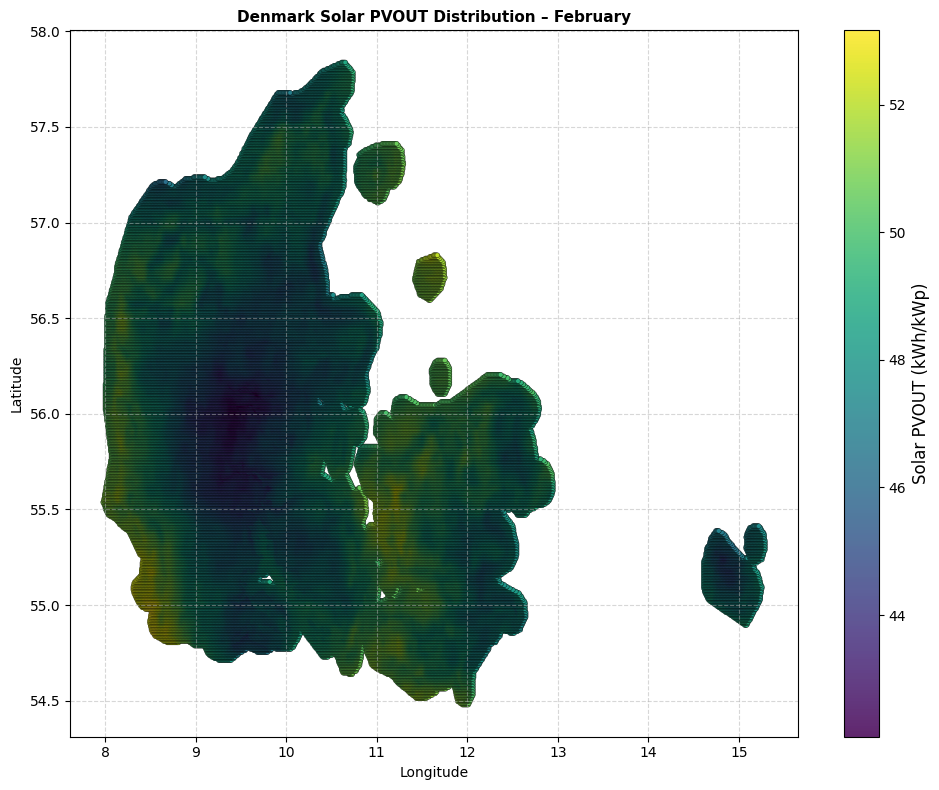

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_March.png


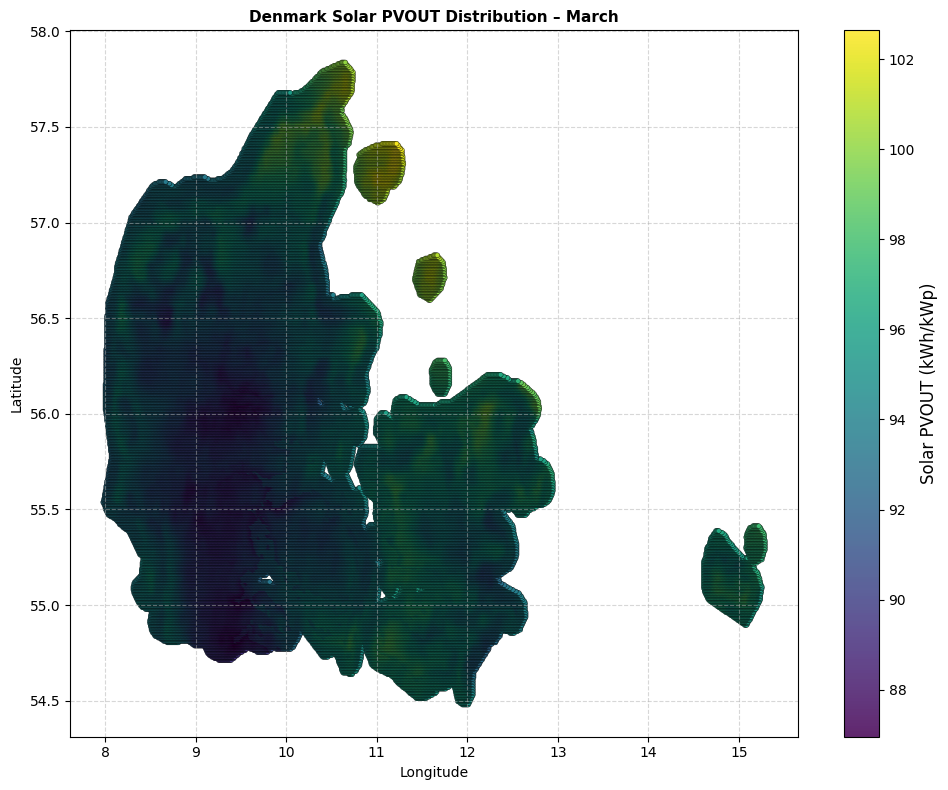

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_April.png


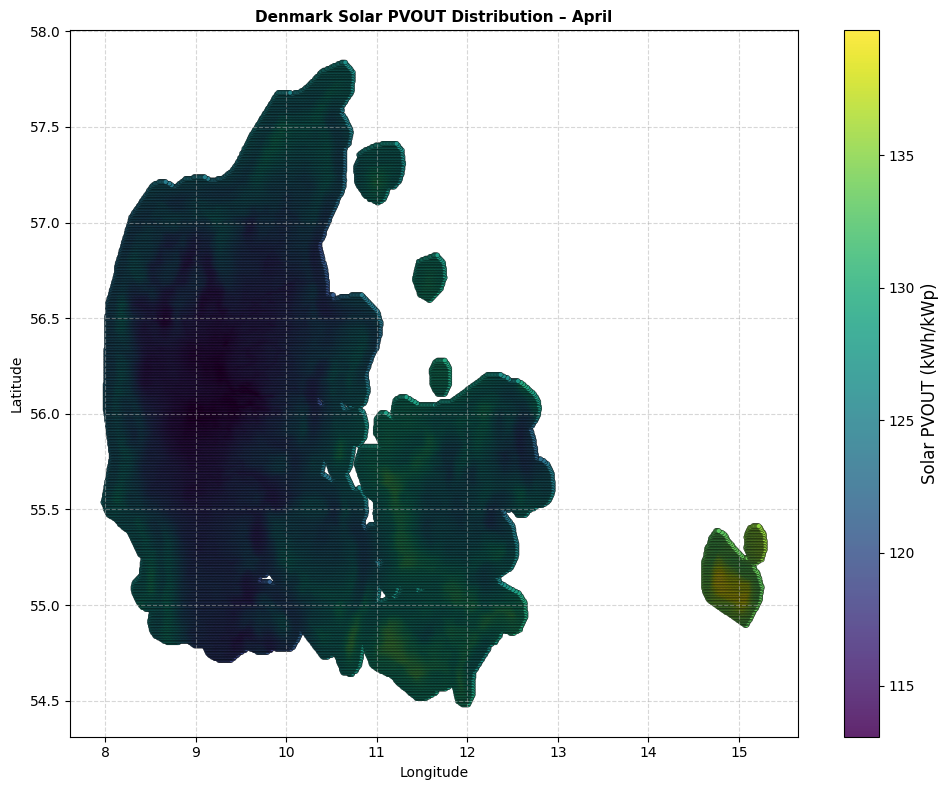

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_May.png


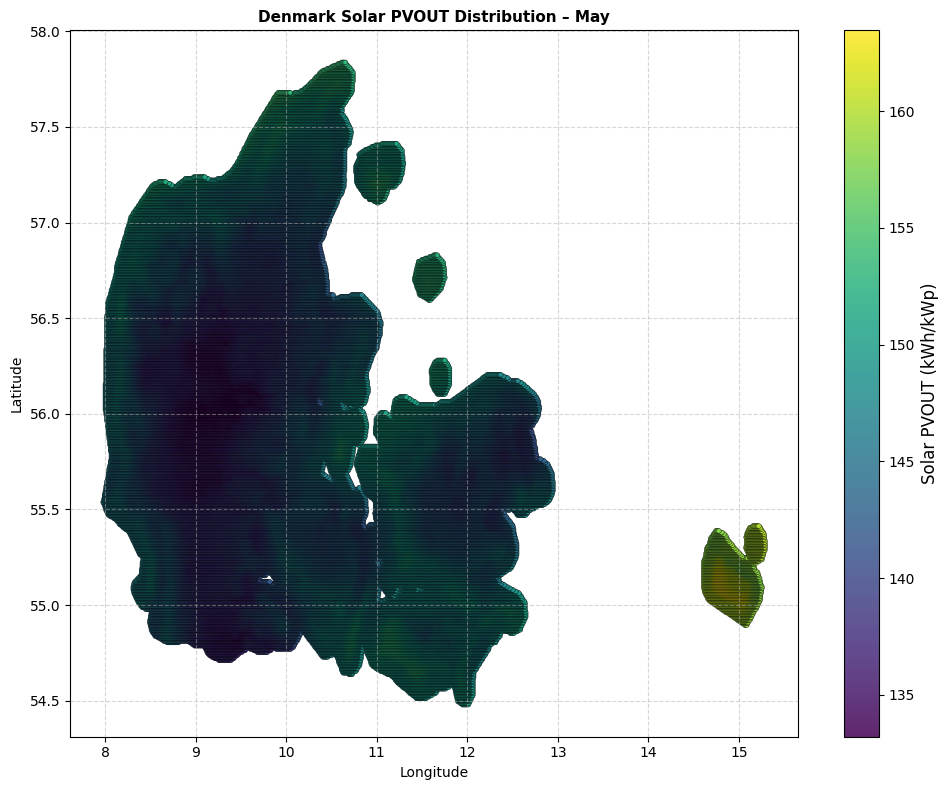

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_June.png


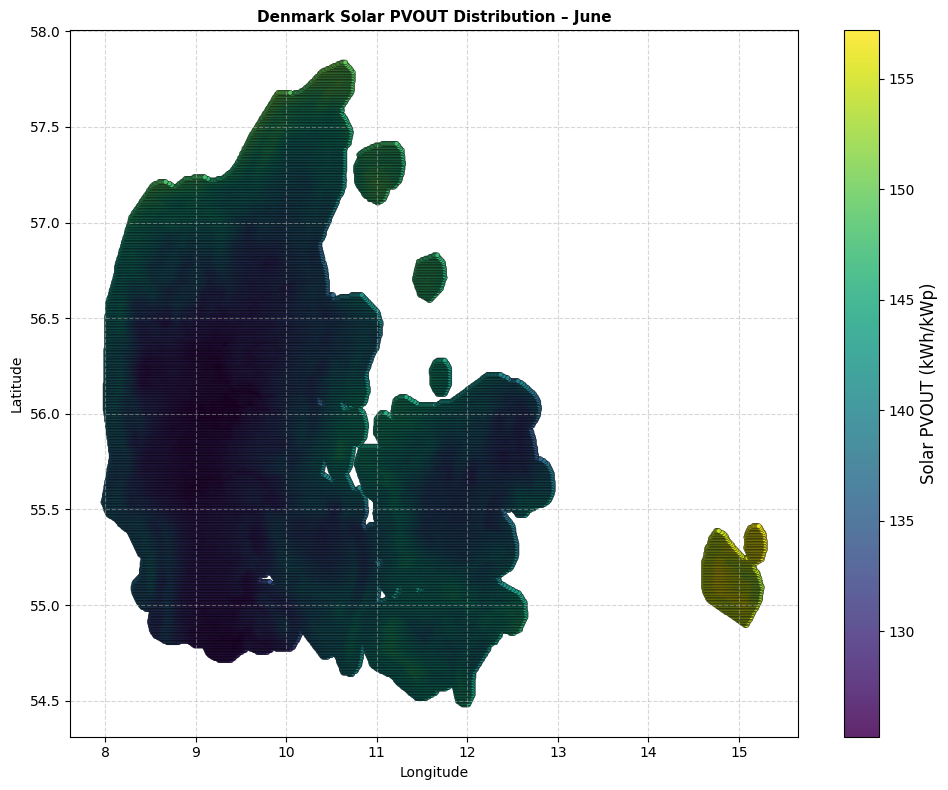

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_July.png


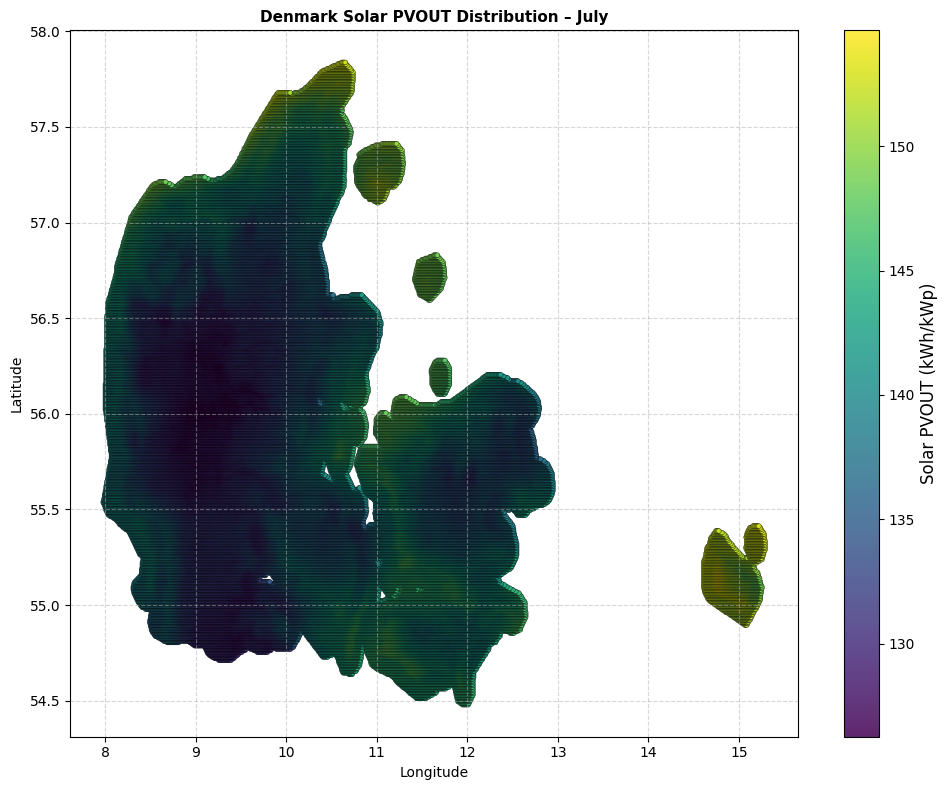

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_August.png


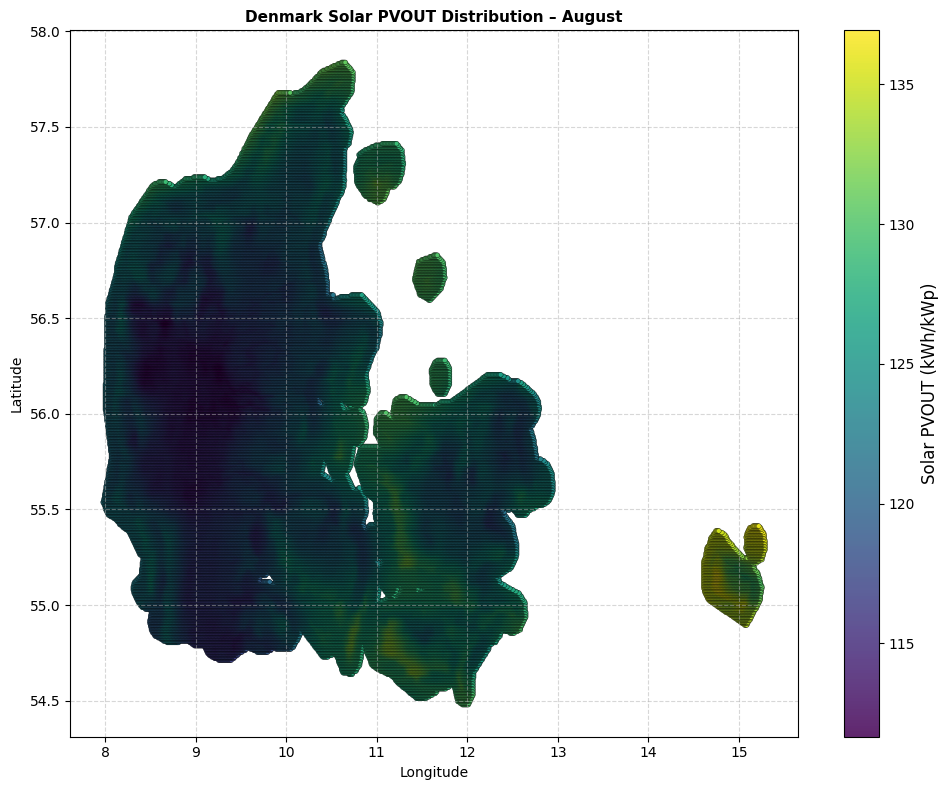

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_September.png


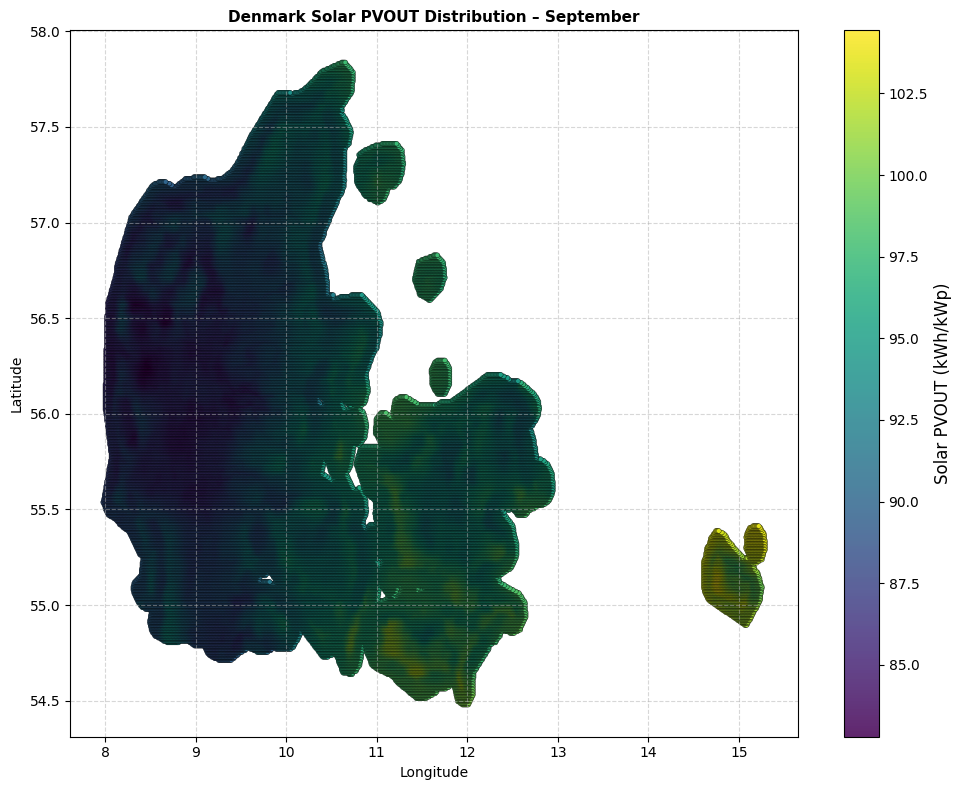

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_October.png


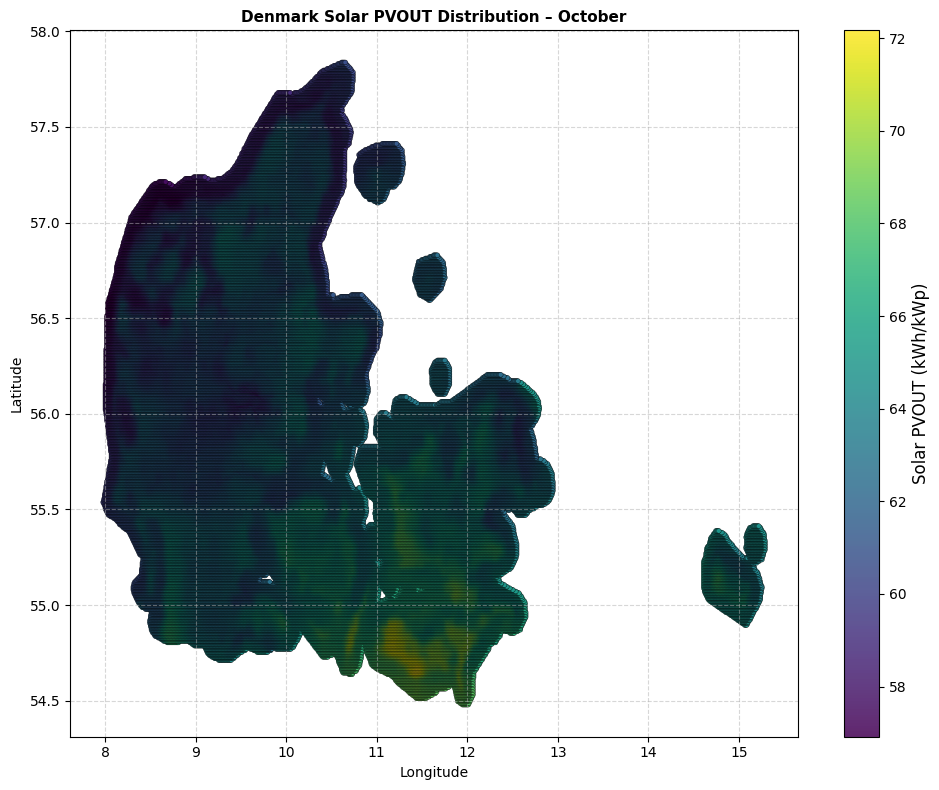

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_November.png


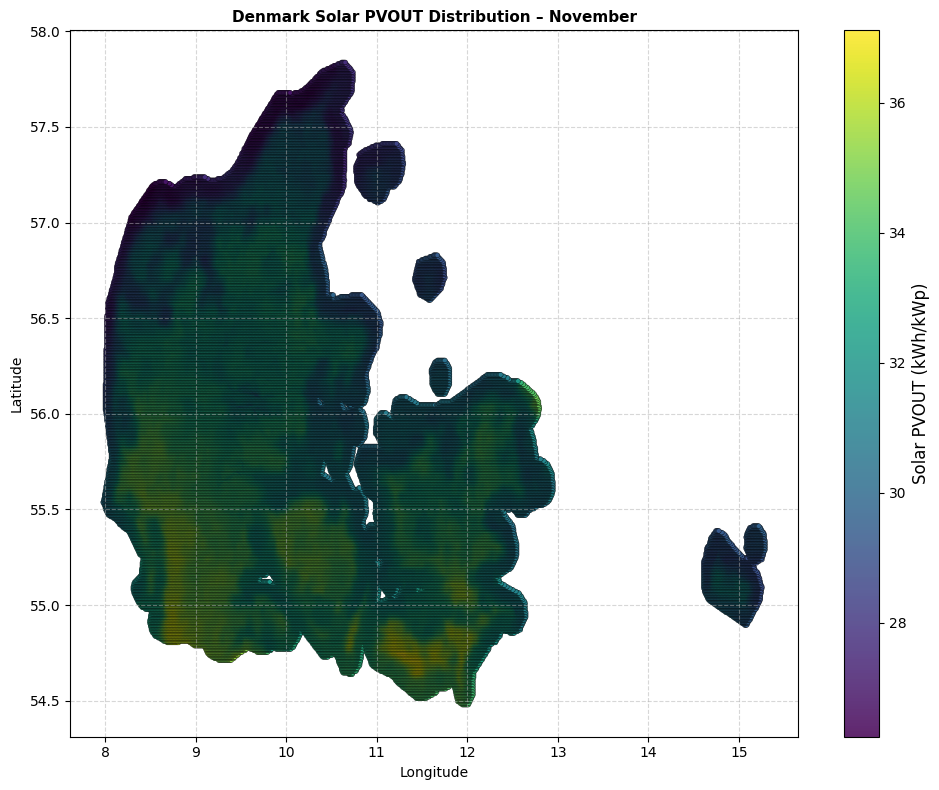

Saved: C:\GISDataManipulation\DenmarkPVOUTPlotOutput\Denmark_PVOUT_December.png


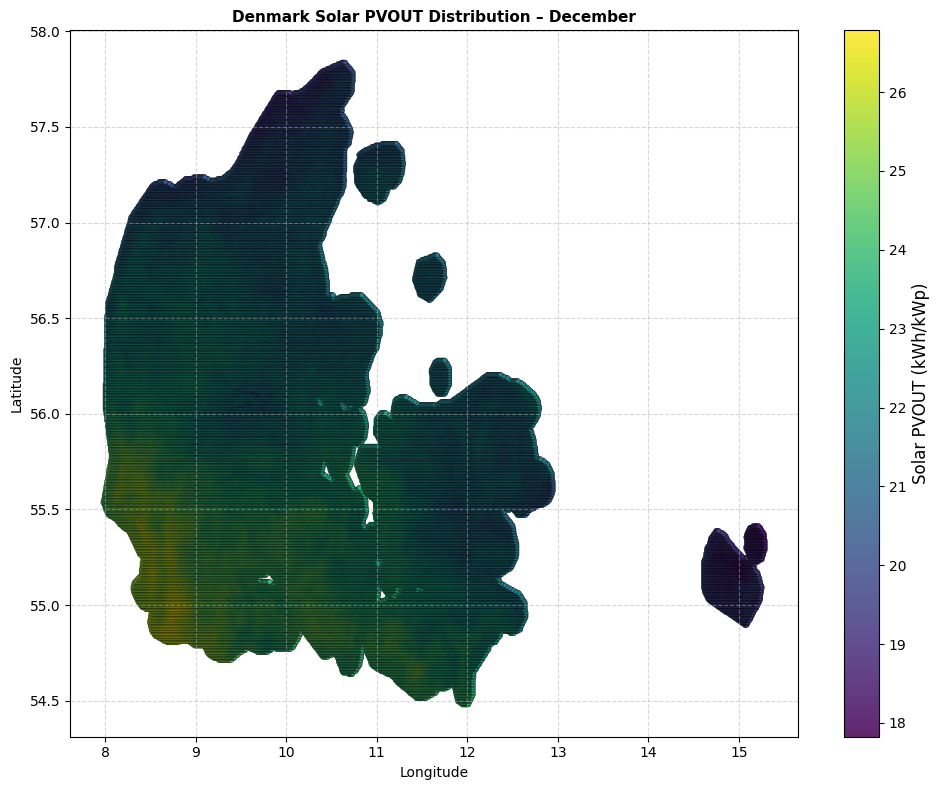

In [5]:
# Denmark 12 Months PVOUT Data Plotting from Year 1994 to 2018
import pandas as pd
import matplotlib.pyplot as plt
import os
import calendar

# Load CSV file
CSV_FILE_PATH = r"C:\GISDataManipulation\DenmarkPVOUTMergedInput\DenmarkSolarPVOUT_12Months.csv"
df = pd.read_csv(CSV_FILE_PATH)

# Output directory for saving plots
OUTPUT_DIR = r"C:\GISDataManipulation\DenmarkPVOUTPlotOutput"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Choose a more readable colormap
COLORMAP = "viridis"  # Alternatives: "coolwarm", "turbo", "magma"

# Loop through each month and create plots
for month in range(1, 13):
    month_col = f"PVOUT_Month_{month:02d}"
    month_name = calendar.month_name[month]  # Convert number to full month name

    plt.figure(figsize=(10, 8))
    sc = plt.scatter(
        df["Longitude"],
        df["Latitude"],
        c=df[month_col],
        cmap=COLORMAP,
        s=12,
        alpha=0.85,
        edgecolor="black",
        linewidth=0.3
    )
    cbar = plt.colorbar(sc)
    cbar.set_label("Solar PVOUT (kWh/kWp)", fontsize=12)

    plt.xlabel("Longitude", fontsize=10)
    plt.ylabel("Latitude", fontsize=10)
    plt.title(f"Denmark Solar PVOUT Distribution – {month_name}", fontsize=11, fontweight="bold")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()

    # Save each graph as PNG
    save_path = os.path.join(OUTPUT_DIR, f"Denmark_PVOUT_{month_name}.png")
    plt.savefig(save_path, dpi=300)
    print(f"Saved: {save_path}")

    plt.show()


In [6]:
#Norway Wind Speed at 100m
import rasterio
import pandas as pd
import numpy as np

# Define file paths
TIF_FILE_PATH = r"C:\GISDataManipulation\GWA Download\NOR_wind-speed_100m.tif"
CSV_OUTPUT_PATH = r"C:\GISDataManipulation\NorwayWindSpeedOutput\NorwayWindSpeed100m.csv"

def tif_to_csv_fast(tif_path, csv_path):
    with rasterio.open(tif_path) as dataset:
        band = dataset.read(1)  # Read first band (wind speed data)

        # Get transform to convert pixel coordinates to lat/lon
        transform = dataset.transform

        # Find valid data points (avoid NaN values)
        rows, cols = np.where(~np.isnan(band))
        values = band[rows, cols]  # Wind speed values

        # Convert pixel row, col to latitude & longitude
        lon, lat = rasterio.transform.xy(transform, rows, cols)

        # Create a Pandas DataFrame
        df = pd.DataFrame({"Latitude": lat, "Longitude": lon, "Wind Speed (m/s)": values})

        # Save to CSV
        df.to_csv(csv_path, index=False)

        print(f"CSV saved successfully: {csv_path}")

# Run optimized function
tif_to_csv_fast(TIF_FILE_PATH, CSV_OUTPUT_PATH)


CSV saved successfully: C:\GISDataManipulation\NorwayWindSpeedOutput\NorwayWindSpeed100m.csv


Wind speed plot saved as PNG: C:\GISDataManipulation\NorwayWindSpeedPlot\NorwayWindSpeed100m_Distribution.png


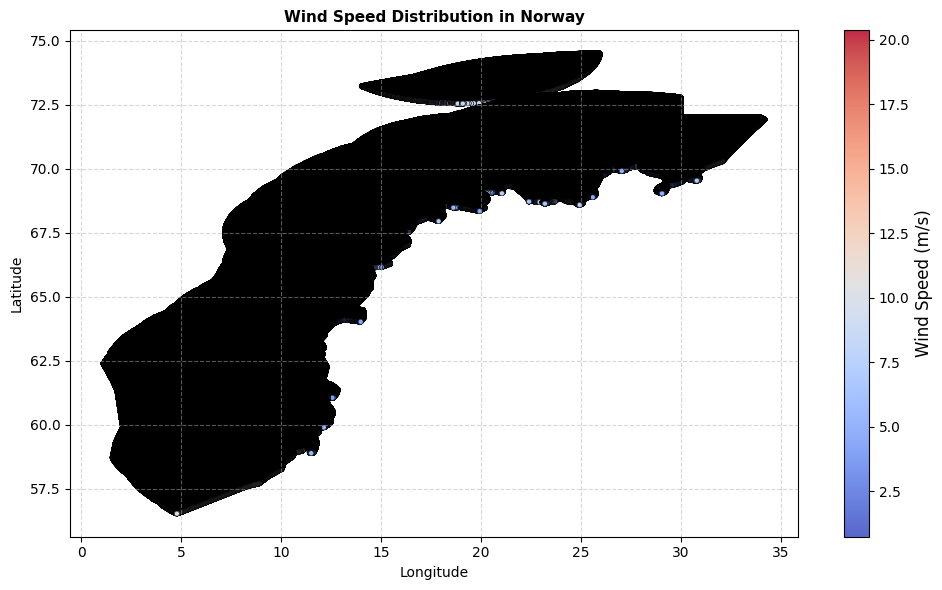

In [7]:
#Norway Wind Speed at 100m Plot
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the path to the Wind CSV file
WIND_CSV_PATH = r"C:\GISDataManipulation\NorwayWindSpeedOutput\NorwayWindSpeed100m.csv"
OUTPUT_PNG_PATH = r"C:\GISDataManipulation\NorwayWindSpeedPlot\NorwayWindSpeed100m_Distribution.png"

# Read the Wind CSV file
df_wind = pd.read_csv(WIND_CSV_PATH)

# Create a scatter plot for Wind Speed
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_wind["Longitude"], df_wind["Latitude"],
                 c=df_wind["Wind Speed (m/s)"], cmap="coolwarm", alpha=0.85, s=12, edgecolor="black", linewidth=0.3)

# Add a color bar to indicate wind speed intensity
cbar = plt.colorbar(sc)
cbar.set_label("Wind Speed (m/s)", fontsize=12)

# Labels and title
plt.xlabel("Longitude", fontsize=10)
plt.ylabel("Latitude", fontsize=10)
plt.title("Wind Speed Distribution in Norway", fontsize=11, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.5)

# Save the plot as PNG
plt.tight_layout()
plt.savefig(OUTPUT_PNG_PATH, dpi=300)
print(f"Wind speed plot saved as PNG: {OUTPUT_PNG_PATH}")

# Show the plot
plt.show()


In [8]:
#Denmark Wind Speed at 100m
import rasterio
import pandas as pd
import numpy as np

# Define file paths
TIF_FILE_PATH = r"C:\GISDataManipulation\GWA Download\DNK_wind-speed_100m.tif"
CSV_OUTPUT_PATH = r"C:\GISDataManipulation\DenmarkWindSpeedOutput\DenmarkWindSpeed100m.csv"


def tif_to_csv_fast(tif_path, csv_path):
    with rasterio.open(tif_path) as dataset:
        band = dataset.read(1)  # Read first band (wind speed data)

        # Get transform to convert pixel coordinates to lat/lon
        transform = dataset.transform

        # Find valid data points (avoid NaN values)
        rows, cols = np.where(~np.isnan(band))
        values = band[rows, cols]  # Wind speed values

        # Convert pixel row, col to latitude & longitude
        lon, lat = rasterio.transform.xy(transform, rows, cols)

        # Create a Pandas DataFrame
        df = pd.DataFrame({"Latitude": lat, "Longitude": lon, "Wind Speed (m/s)": values})

        # Save to CSV
        df.to_csv(csv_path, index=False)

        print(f"CSV saved successfully: {csv_path}")

# Run optimized function
tif_to_csv_fast(TIF_FILE_PATH, CSV_OUTPUT_PATH)


CSV saved successfully: C:\GISDataManipulation\DenmarkWindSpeedOutput\DenmarkWindSpeed100m.csv


Wind speed plot saved as PNG: C:\GISDataManipulation\DenmarkWindSpeedPlot\DenmarkWindSpeed100m_Distribution.png


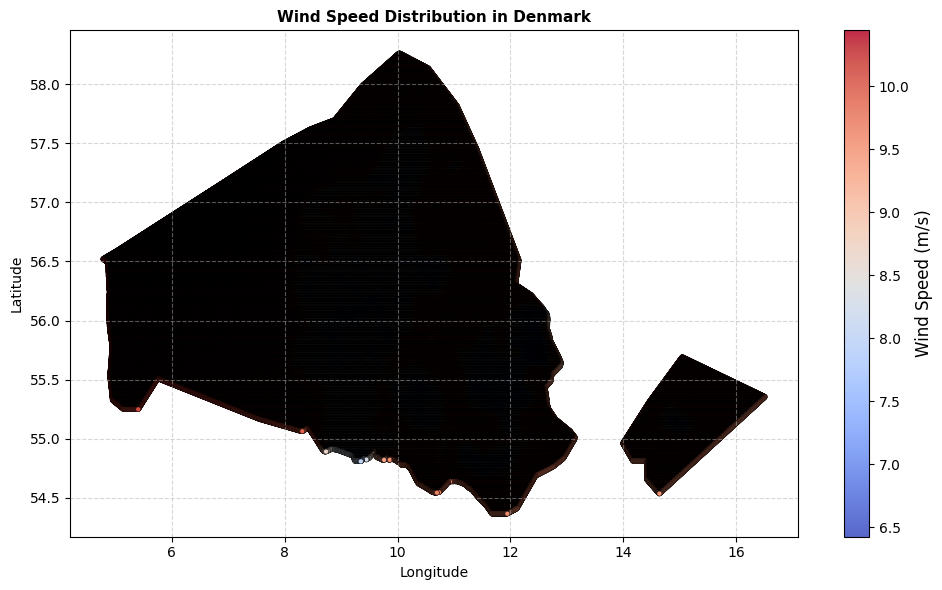

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the path to the Wind CSV file
WIND_CSV_PATH = r"C:\GISDataManipulation\DenmarkWindSpeedOutput\DenmarkWindSpeed100m.csv"
OUTPUT_PNG_PATH = r"C:\GISDataManipulation\DenmarkWindSpeedPlot\DenmarkWindSpeed100m_Distribution.png"

# Read the Wind CSV file
df_wind = pd.read_csv(WIND_CSV_PATH)

# Create a scatter plot for Wind Speed
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_wind["Longitude"], df_wind["Latitude"],
                 c=df_wind["Wind Speed (m/s)"], cmap="coolwarm", alpha=0.85, s=12, edgecolor="black", linewidth=0.3)

# Add a color bar to indicate wind speed intensity
cbar = plt.colorbar(sc)
cbar.set_label("Wind Speed (m/s)", fontsize=12)

# Labels and title
plt.xlabel("Longitude", fontsize=10)
plt.ylabel("Latitude", fontsize=10)
plt.title("Wind Speed Distribution in Denmark", fontsize=11, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.5)

# Save the plot as PNG
plt.tight_layout()
plt.savefig(OUTPUT_PNG_PATH, dpi=300)
print(f"Wind speed plot saved as PNG: {OUTPUT_PNG_PATH}")

# Show the plot
plt.show()


In [10]:
# Text File Conversion for Wind Speed Norway
import rasterio
import numpy as np

# Input and output paths
TIF_FILE_PATH = r"C:\GISDataManipulation\GWA Download\NOR_wind-speed_100m.tif"
OUTPUT_TXT_PATH = r"C:\GISDataManipulation\NorwayWindSpeed100mTXT\NorwayWindSpeed100mTxtFile.txt"

def tif_to_txt(tif_path, txt_path):
    with rasterio.open(tif_path) as dataset:
        band = dataset.read(1)
        transform = dataset.transform
        height, width = band.shape

        with open(txt_path, 'w') as f:
            f.write("Latitude,Longitude,Wind_Speed\n")  # header
            for row in range(height):
                for col in range(width):
                    value = band[row, col]
                    if not np.isnan(value):
                        lon, lat = rasterio.transform.xy(transform, row, col)
                        f.write(f"{lat},{lon},{value}\n")

    print(f"TIF successfully converted to TXT at: {txt_path}")

# Run the conversion
tif_to_txt(TIF_FILE_PATH, OUTPUT_TXT_PATH)


TIF successfully converted to TXT at: C:\GISDataManipulation\NorwayWindSpeed100mTXT\NorwayWindSpeed100mTxtFile.txt


Wind speed plot saved as PNG: C:\GISDataManipulation\NorwayWindSpeedPlot\NorwayWindSpeed100m_DistributioFromTxtFile.png


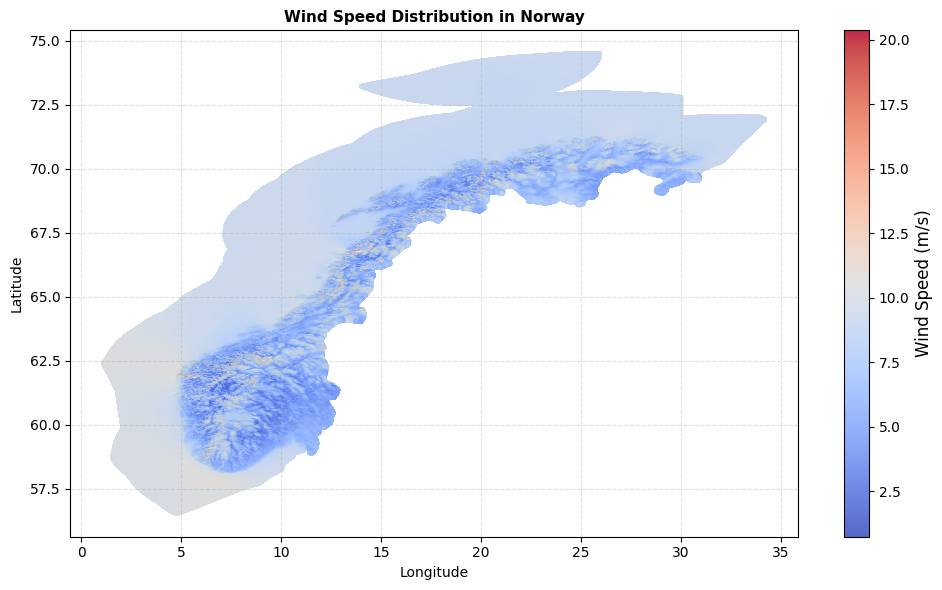

In [11]:
# Text File Plot for Norway Wind Speed Norway
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the path to the Wind TXT file (make sure the TXT has columns: Latitude, Longitude, Wind_Speed)
WIND_TXT_PATH = r"C:\GISDataManipulation\NorwayWindSpeed100mTXT\NorwayWindSpeed100mTxtFile.txt"
OUTPUT_PNG_PATH = r"C:\GISDataManipulation\NorwayWindSpeedPlot\NorwayWindSpeed100m_DistributioFromTxtFile.png"

# Read the TXT file (comma-separated)
df_wind = pd.read_csv(WIND_TXT_PATH, delimiter=",")  # Change delimiter if needed (e.g., '\t' for tab-separated)

# Check column names and adapt dynamically:
possible_wind_columns = [col for col in df_wind.columns if 'wind' in col.lower() or 'value' in col.lower()]
wind_col = possible_wind_columns[0]  # take first match

# Create a scatter plot for Wind Speed
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_wind["Longitude"], df_wind["Latitude"],
                 c=df_wind[wind_col], cmap="coolwarm", alpha=0.85, s=10, edgecolor="none")

# Add a color bar to indicate wind speed intensity
cbar = plt.colorbar(sc)
cbar.set_label("Wind Speed (m/s)", fontsize=12)

# Labels and title
plt.xlabel("Longitude", fontsize=10)
plt.ylabel("Latitude", fontsize=10)
plt.title("Wind Speed Distribution in Norway", fontsize=11, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.4)

# Save the plot as PNG
plt.tight_layout()
plt.savefig(OUTPUT_PNG_PATH, dpi=300)
print(f"Wind speed plot saved as PNG: {OUTPUT_PNG_PATH}")

# Show the plot
plt.show()


In [12]:
# Text File Conversion for Wind Speed Denmark
import rasterio
import numpy as np

# Input and output paths
TIF_FILE_PATH = r"C:\GISDataManipulation\GWA Download\DNK_wind-speed_100m.tif"
OUTPUT_TXT_PATH =r"C:\GISDataManipulation\DenmarkWindSpeed100mTXT\DenmarkWindSpeed100mRasterTXT.txt"

def tif_to_txt(tif_path, txt_path):
    with rasterio.open(tif_path) as dataset:
        band = dataset.read(1)
        transform = dataset.transform
        height, width = band.shape

        with open(txt_path, 'w') as f:
            f.write("Latitude,Longitude,Wind_Speed\n")  # header
            for row in range(height):
                for col in range(width):
                    value = band[row, col]
                    if not np.isnan(value):
                        lon, lat = rasterio.transform.xy(transform, row, col)
                        f.write(f"{lat},{lon},{value}\n")

    print(f"TIF successfully converted to TXT at: {txt_path}")

# Run the conversion
tif_to_txt(TIF_FILE_PATH, OUTPUT_TXT_PATH)


TIF successfully converted to TXT at: C:\GISDataManipulation\DenmarkWindSpeed100mTXT\DenmarkWindSpeed100mRasterTXT.txt


Wind speed plot saved as PNG: C:\GISDataManipulation\DenmarkWindSpeedPlot\DenmarkWindSpeed100m_DistributioFromTxtFile.png


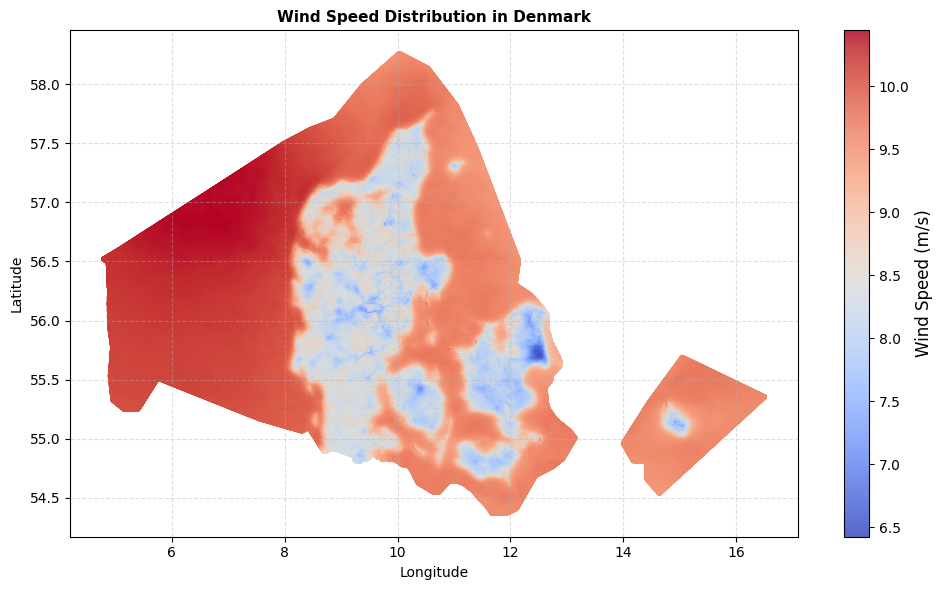

In [13]:
# Text File Plot for Norway Wind Speed Denmark
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the path to the Wind TXT file (make sure the TXT has columns: Latitude, Longitude, Wind_Speed)
WIND_TXT_PATH = r"C:\GISDataManipulation\DenmarkWindSpeed100mTXT\DenmarkWindSpeed100mRasterTXT.txt"
OUTPUT_PNG_PATH = r"C:\GISDataManipulation\DenmarkWindSpeedPlot\DenmarkWindSpeed100m_DistributioFromTxtFile.png"

# Read the TXT file (comma-separated)
df_wind = pd.read_csv(WIND_TXT_PATH, delimiter=",")  # Change delimiter if needed (e.g., '\t' for tab-separated)

# Check column names and adapt dynamically:
possible_wind_columns = [col for col in df_wind.columns if 'wind' in col.lower() or 'value' in col.lower()]
wind_col = possible_wind_columns[0]  # take first match

# Create a scatter plot for Wind Speed
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_wind["Longitude"], df_wind["Latitude"],
                 c=df_wind[wind_col], cmap="coolwarm", alpha=0.85, s=10, edgecolor="none")

# Add a color bar to indicate wind speed intensity
cbar = plt.colorbar(sc)
cbar.set_label("Wind Speed (m/s)", fontsize=12)

# Labels and title
plt.xlabel("Longitude", fontsize=10)
plt.ylabel("Latitude", fontsize=10)
plt.title("Wind Speed Distribution in Denmark", fontsize=11, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.4)

# Save the plot as PNG
plt.tight_layout()
plt.savefig(OUTPUT_PNG_PATH, dpi=300)
print(f"Wind speed plot saved as PNG: {OUTPUT_PNG_PATH}")

# Show the plot
plt.show()
